In [1]:
import numpy as np
from PIL import Image as pim

In [2]:
!pwd

/home/stepan_chous/dev/audio-image-processing/kolovorotnyysd_B21_524/2sem


In [3]:
rgb_image = pim.open('results/input/198_267.png')
rgb_array = np.array(rgb_image)

In [4]:
grey_scale = (0.3 * rgb_array[:, :, 0] + 
              0.59 * rgb_array[:, :, 1] + 
              0.11 * rgb_array[:, :, 2])
grey_scale.shape

(4050, 3050)

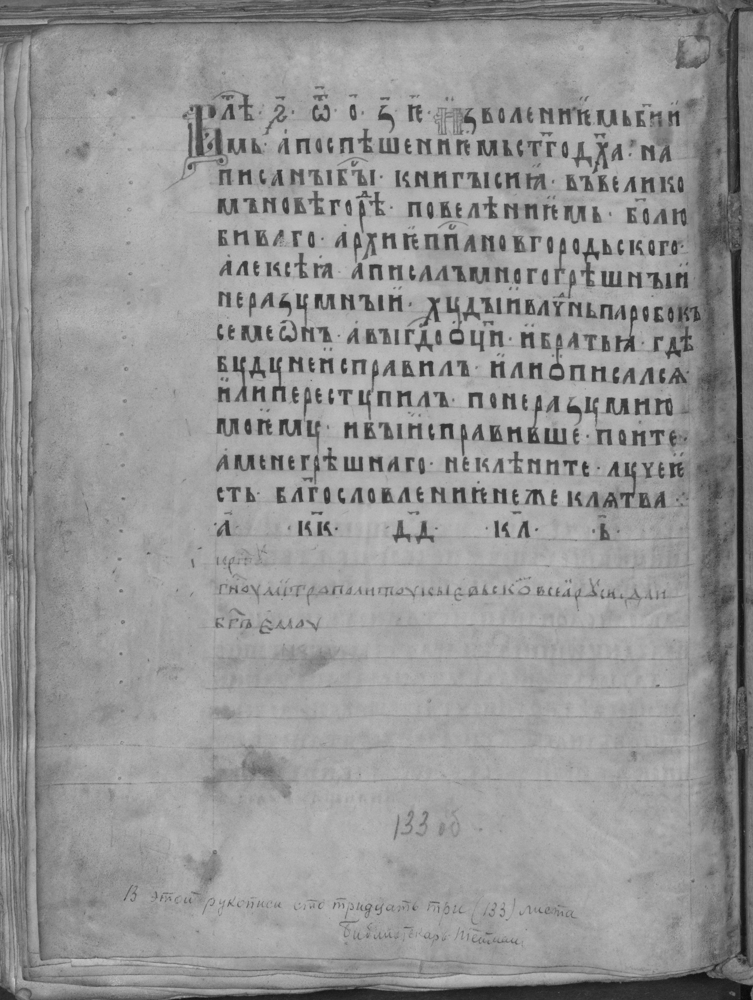

In [5]:
pim.fromarray(grey_scale.astype('uint8'))

In [6]:
grey_scale.shape

(4050, 3050)

In [7]:
n = 10
k = 0.5
r = 128
min_brightness = grey_scale.min()

height, width = grey_scale.shape

row_count = height // n if height % n == 0 else height // n + 1 
col_count = width // n if width % n == 0 else width // n + 1 

bin_image = grey_scale.copy()

for i in range(row_count):
    for j in range(col_count):
        block = bin_image[i * n : (i + 1) * n, j * n : (j + 1) * n]
        # print(f'range: ({i * n} : {(i + 1) * n}), ({j * n} : {(j + 1) * n})')
        m = block.mean()
        s = block.var()

        threshold = ((1 - k) * m +
                      k * min_brightness + 
                      k * s / r * (m - min_brightness))
        
        bin_image[i * n : (i + 1) * n, j * n : (j + 1) * n] = block > threshold

bin_image *= 255

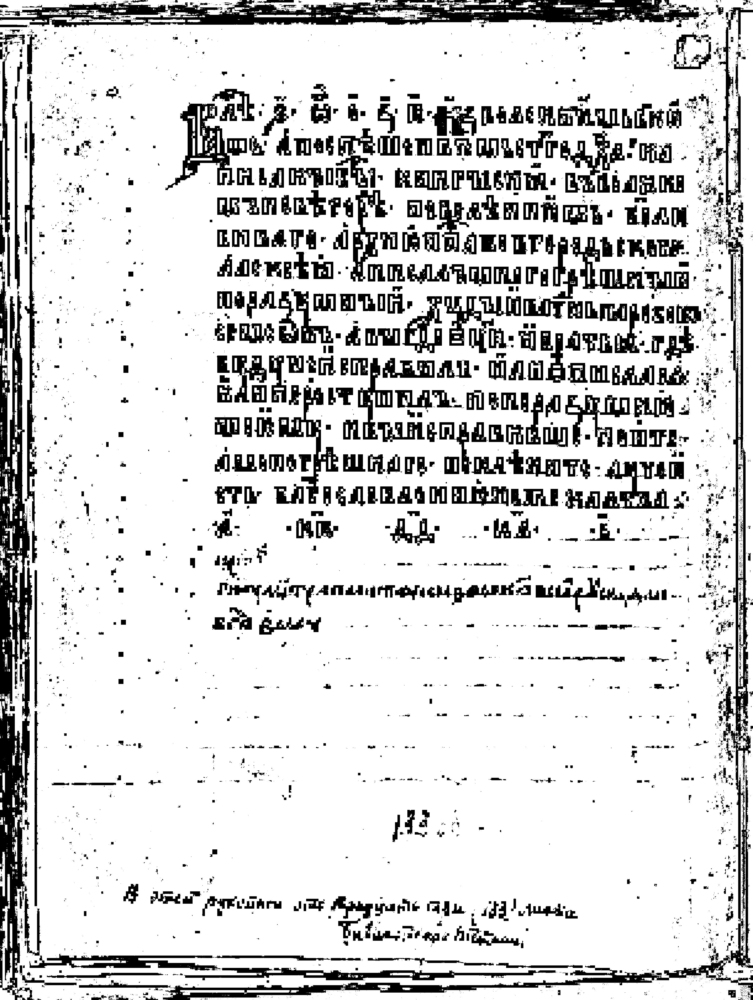

In [8]:
pim.fromarray(bin_image.astype('uint8'))